# IE550-A

### EFC 2 - Data de Entrega: 05/04

Aluno: Rodolfo De Nadai

RA: 208911

In [1]:
import os
import math
import wave
import warnings
from struct import unpack
warnings.filterwarnings('ignore')

import numpy as np
from scipy import fftpack
from scipy.signal import decimate, resample
from scipy.interpolate import interp1d
from matplotlib import pyplot as plt
import mpmath
import IPython

from support.efc2.filtro import filtro
from support.efc2.espectro import espectro

%matplotlib inline

path = os.getcwd()

Abaixo são funções de apoio ao desenvolvimento do relatório. Aqui são implementados a decimação e interpolação, além do filtro passa-baixa e funções para carregamento do audio e apresentação dos resultados em gráficos.

In [2]:
def load_audio(filename):
    with wave.open(filename, 'r') as spf:
        nchannels = spf.getnchannels()
        nframes = spf.getnframes()
        Fs = spf.getframerate()
        #Extract Raw Audio from Wav File
        data = spf.readframes(nframes)
    return Fs, np.fromstring(data, 'int32')

7
def spectre(y):
    N = 2048
    Y = abs(fftpack.fft(y, N))
    w = np.linspace(0, math.pi, math.floor(Y.size/2))
    return w, Y[0:w.size]


def show_time_freq(x, w, X):
    plt.figure(1, figsize=(16, 12))

    plt.subplot(221)
    plt.plot(x)
    plt.xlabel('n', fontsize=10)
    plt.ylabel('x[n]', fontsize=10)
    plt.grid(True)
    plt.title('Domínio do Tempo')

    plt.subplot(222)
    plt.plot(w, X)
    plt.xlabel(r'$\omega$ [rad]', fontsize=10)
    plt.ylabel(r'|$Y(e^{j\omega})$|', fontsize=10)
    plt.grid(True)
    plt.title('Resposta em Frequência')
    plt.xlim(0, math.pi)
    plt.ylim(0, max(X))

    plt.show()

def create_filter(size, fator, ganho=.1):
    # Filtro
    wp = math.pi / fator
    wr = wp + ganho
    h = filtro(wp, wr)
    h = np.array(h.tolist(), dtype=np.float64)
    s = len(h)
    size = size if s < size else s
    return correct_filter_size(size, h)

def correct_filter_size(size, h):
    hn = np.zeros(size)
    hn[:len(h)] = h
    return hn

def decimacao(x, M, filtro=None):
    """Aplicamos o filtro no dominio da frequencia e retornamos n amostras de M em M."""
    # Filtro
    h = filtro
    if h is None:
        h = create_filter(x.shape[0], M)
    else:
        h = correct_filter_size(x.shape[0], h)
    return (fftpack.ifft(fftpack.fft(x) * fftpack.fft(h))[::M]).real

def interpolacao(x, L, filtro=None):
    """Função de interpolação por um fator M."""
    y = np.zeros(train.shape[0] * L, dtype=np.float64)
    y[::L] = 2
    y[np.where((y % 2 == 0) & (y > 0))] = x
    # Filtro
    h = filtro
    if h is None:
        h = create_filter(y.shape[0], L)
    else:
        h = correct_filter_size(x.shape[0], h)
    return (fftpack.ifft(fftpack.fft(y) * fftpack.fft(h))).real

def dec_inter_racional(x, L, M, filtro=None):
    """Função que monta o Caso Geral apresentado em aula."""
    # Interpolação
    y = np.zeros(train.shape[0] * L, dtype=np.float64)
    y[::L] = 2 # Apenas para que possamos selecionar os índices no where abaixo
    y[np.where((y % 2 == 0) & (y > 0))] = x
    # Filtro
    h = filtro
    if h is None:
        h = create_filter(y.shape[0], max(L, M))
    else:
        h = correct_filter_size(x.shape[0], h)
    # Decimação
    return (fftpack.ifft(fftpack.fft(y) * fftpack.fft(h))[::M]).real

### Primeira Parte: Sinal de Apito de Trem

Filtro com resposta em frequência gerado quando $wp = \frac{\pi}{3.4}$ rad e $wr = (\frac{\pi}{3.4} + 0.1)$ rad.

Estou usando 3.4 como limite, para ser um valor mais aproximado a 1 rad.

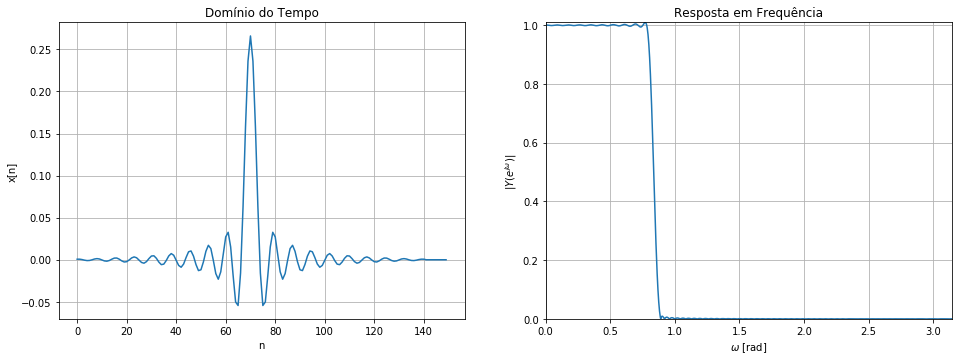

In [3]:
h = create_filter(150, 4, .1)
show_time_freq(h, *spectre(h))

Vamos utilizar o som de um apito de trem para realizar os primeiros testes.

In [4]:
Fs, train = load_audio(f"{path}/support/sound/train.wav")
rate_diff = 1.5722
print('Audio apito do trem:')
print('Fs:', Fs)
print('Rate diff:', rate_diff)
IPython.display.Audio(data=train, rate=Fs)

Audio apito do trem:
Fs: 8192
Rate diff: 1.5722


Informações do som original (apito do trem).


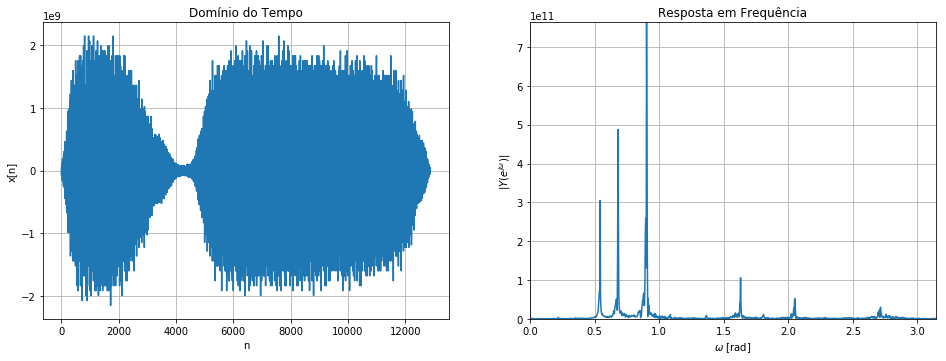

In [5]:
print('Informações do som original (apito do trem).')
show_time_freq(train, *spectre(train))

**(a)** Reduza a taxa de amostragem por um fator $M$ e observe, tanto no domínio do tempo quanto na frequência,
o que ocorreu.

Após efetiar a decimação com redução de $M=3$ é possível observar pelos gráficos e pelo som audível que após a perda de amostras o som perdeu sua composição original incorrendo na perda de frequências.

Informações do som original após decimação por fator 3.
Fs:  3000 hz


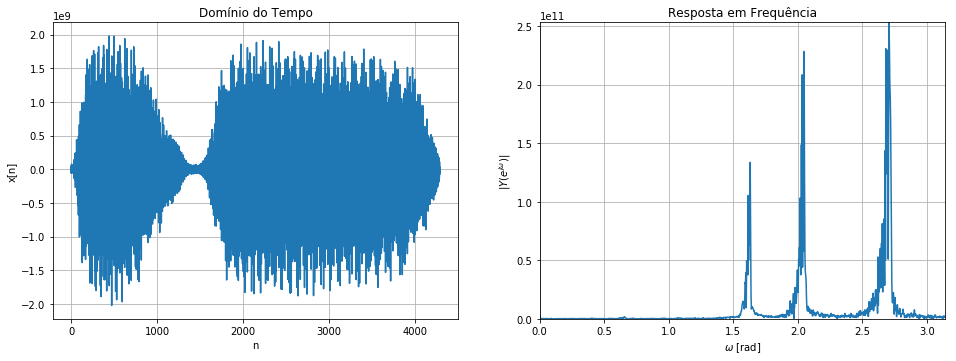

In [6]:
M = 3
decimado = decimacao(train, M)
Fs = int(len(decimado) / rate_diff)
Fs = Fs if Fs > 3000 else 3000

print(f'Informações do som original após decimação por fator {M}.')
print('Fs: ', Fs, 'hz')
show_time_freq(decimado, *spectre(decimado))

In [7]:
IPython.display.Audio(data=decimado, rate=Fs)

**(b)** Aumente a taxa de amostragem por um fator $L$ e observe nos domínios do tempo e da frequência o que
ocorreu.

Após a interpolação usando com aumento $L=3$, é possível notar que a quantidade de amostras aumentou no domínio do tempo (aumentando a duração do som) em L segundos. No domínio da frequência nota-se que as frequências reduziram seu espectro no limite definido pelo corte do filtro que é $\frac{pi}{L}$.


Informações do som original após interpolação por fator 3.
Fs:  24577 hz


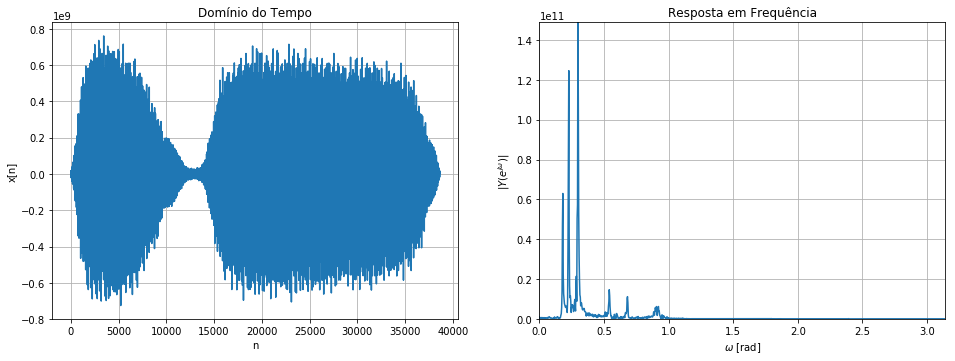

In [8]:
L = 3
interpolado = interpolacao(train, L)
Fs = int(len(interpolado) / rate_diff)

print(f'Informações do som original após interpolação por fator {L}.')
print('Fs: ', Fs, 'hz')
show_time_freq(interpolado, *spectre(interpolado))

In [9]:
IPython.display.Audio(data=interpolado, rate=Fs)

**(c)** Ajuste a taxa de amostragem por um fator racional do tipo $L/M$, combinando as estratégias de interpolação e decimação. Façaa o mesmo tipo de análise dos itens anteriores.

Como teste vamos mudar a taxa de 8192 hz para 44236 hz (próximo dos 44100) adicionar um ganho de $L=27$ e uma redução de $M=5$.

Fazenso a operação de interpolação e decimação, conseguimos manter quase que em 100% o som original (excluindo apenas pequenas frequências que estavam foram do corte do filtro). Mas agora com uma taxa de amostragem muito superior a inicial.

Informações do som original após interpolação por 27 e decimação por 5.
Fs:  44238 hz


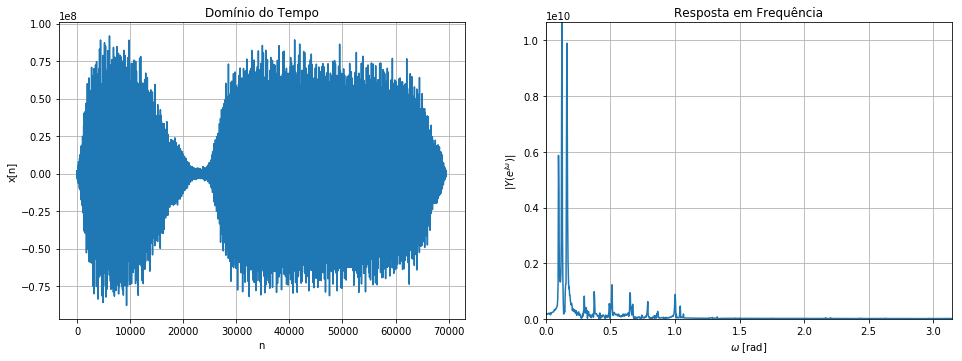

In [10]:
L, M = 27, 5
y = dec_inter_racional(train, L, M)
Fs = int(len(y) / rate_diff)

print(f'Informações do som original após interpolação por {L} e decimação por {M}.')
print('Fs: ', Fs, 'hz')
show_time_freq(y, *spectre(y))

In [11]:
IPython.display.Audio(data=y, rate=Fs)

**(anexo 1)** Comente o que você percebeu que mudou em relação ao som original quando realizou cada procedimento.

Ao manter a taxa de amostragem em um nível onde não ocorre muito aliasing conseguimos manter uma aproximação audível bem próxima do som original.

Interessante notar que ao realizar uma decimação com fator > 4 começa-se a adicionar maior ruído ao som do apito, devido ao aliasing formado com a sobreposição de alta frequências, mesmo utilizando o filtro passa-baixo.

No item (c) onde foi criado um caso geral para mudança na taxa de amostragem, o som final é muito parecido ao original, entretanto, pelo aumento considerável de amostras novas frequências (antes pouco audíveis) acabam por ter o ganho relacionado ao fator L definido. Isso ocasiona maior número de frequências mais altas.

**(anexo 2)** “Brinque” também com os parâmetros dos filtros passa-baixas envolvidos nos esquemas de interpolação e dizimação. Relate brevemente o que se pode observar.

Com relação ao filtro é possível notar que a frequência de corte dele influência diretamente a entrada de baixas frequências no som após interpolação e um corte das altas frequências na decimação.

Como exemplo usaremos um filtro com $w=\frac{\pi}{50}$ rad para perceber que apenas baixas frequências retorna após uma decimação com redução de $M=2$.

Informações do filtro com fator 50.


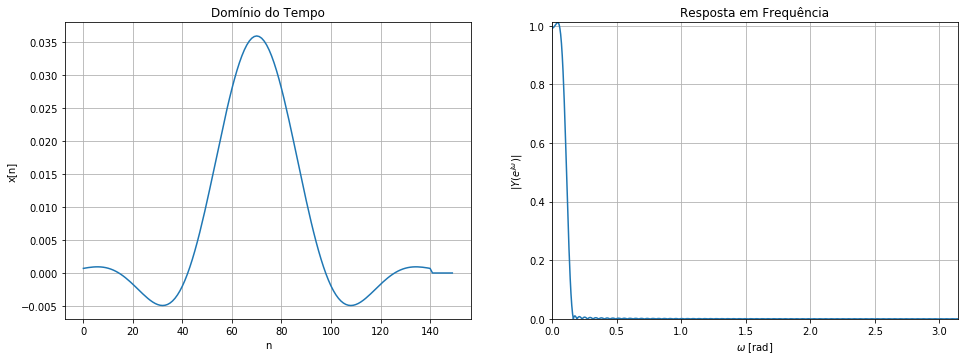

Informações do som original após decimação por fator 2.
Fs:  4096 hz


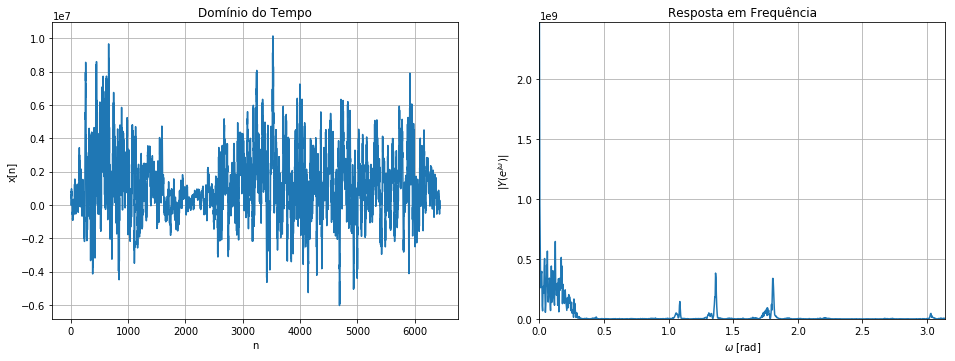

In [12]:
M = 2
f = 50

fil = create_filter(150, f)

decimado = decimacao(train, M, filtro=fil)
Fs = int(len(decimado) / rate_diff)
Fs = Fs if Fs > 3000 else 3000

print(f'Informações do filtro com fator {f}.')
show_time_freq(fil, *spectre(fil))

print(f'Informações do som original após decimação por fator {M}.')
print('Fs: ', Fs, 'hz')
show_time_freq(decimado, *spectre(decimado))

In [13]:
IPython.display.Audio(data=decimado, rate=Fs)

### Segunda Parte: Sinal Musical

Apenas por simplicidade, vamos somar os dois canais para realizar o experimento:

$y = y[:, 1] + y[:, 2];$

*OBS.: A taxa de amostragem tipicamente empregada em sinais de áudio (e.g., música) corresponde a 44,1 kHz*


In [14]:
Fs, musica = load_audio(f"{path}/support/sound/creed_my_sacrifice.wav")
rate_diff = 32.354
print('Música do Creed:')
print('Fs:', Fs)
print('Rate diff:', rate_diff)
IPython.display.Audio(data=musica, rate=Fs)

Música do Creed:
Fs: 44100
Rate diff: 32.354


**(d)** Mostre o espectro de frequências do sinal de áudio e discuta seu conteúdo espectral.

Podemos notar no domínio do tempo uma alta amplitude após 500000 mil amostras, neste momento do audio temos apenas notas sendo tocadas na guitarra, após essas amostras entra em cena outros instrumentos e o som da guitarra fica mais grave, que ocasiona um "disturbio" maior pela união de diversas ondas produzidas pelos instrumentos.

Na frequência é possível notar que a maior parte das frequências estão posicionadas próximos a zero e $\pi$.

Informações da música do Creed.


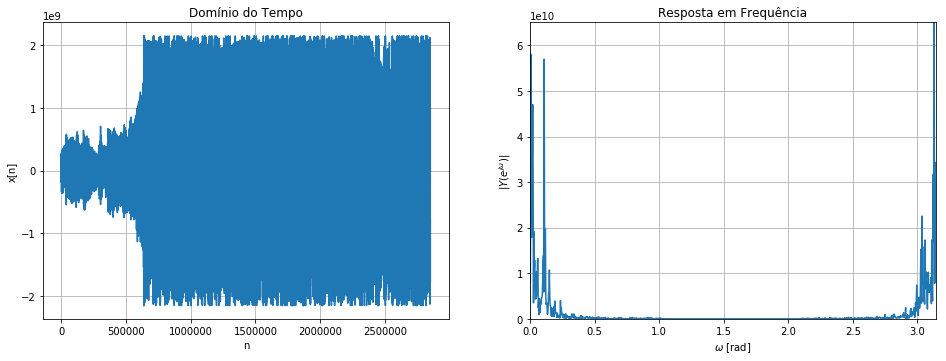

In [15]:
print(f'Informações da música do Creed.')
show_time_freq(musica, *spectre(musica))

**(e)** Sem realizar a pré-filtragem, reduza a taxa de amostragem por um fator de $M=6$. Apresente o espectro do sinal subamostrado e discuta as mudanças em relação ao espectro do sinal original.

Ao utilizar o fator redução M=6 sem realizar a pré-filtragem, muitas faixas de frequência são perdidas e o sinal, apesar de no domínio do tempo parecer igual, na frequência nota-se a perda de grandes frequências que existiam no som original. Mesmo desta maneira, se mantivermos a taxa de amostragem relativa ao valor original de Fs, ainda é possível manter a qualidade do som sem a necessidade do uso de filtro.

Informações da música do Creed após decimação por fator 6 sem filtro.


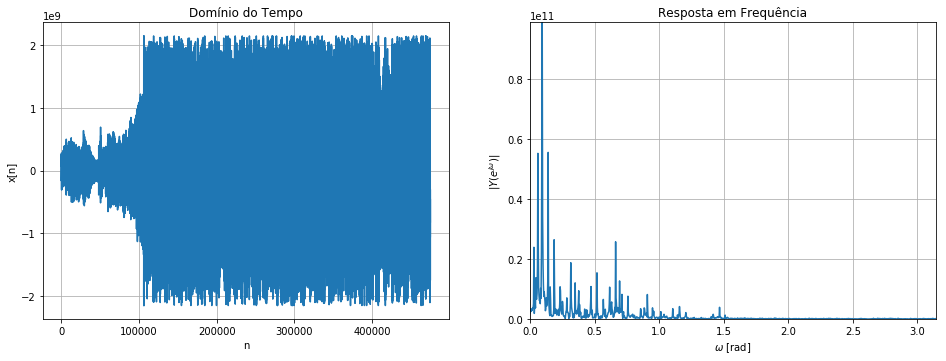

In [16]:
M = 6
y_no_filter = musica[::M]
print(f'Informações da música do Creed após decimação por fator {M} sem filtro.')
show_time_freq(y_no_filter, *spectre(y_no_filter))

**(f)** Ouça, então, o sinal de áudio original e o subamostrado. Mas agora passando como segundo parâmetro o valor da taxa de amostragem associada ao sinal. Comente as diferençaas.
OBS.: Lembre-se que, após a decimação, a taxa de amostragem foi reduzida para $fs/M$.

In [17]:
Fs = int(len(y_no_filter) / rate_diff)
print('Fs: ', Fs, 'hz')
IPython.display.Audio(data=y_no_filter, rate=Fs)

Fs:  14688 hz


 **(g)** Filtre, agora, o sinal de áudio original com um filtro passa-baixas para reduzir o aliasing. Você deve tentar identificar valores apropriados para wp e wr. Apresente a resposta em frequência do filtro, o espectro do sinal filtrado e compare-o com o espectro do sinal original. Ouça, então, ambos os sinais e discuta as diferenças percebidas.

Entretanto mesmo usando o filtro passa-baixa com valores definidos anteriormente, $wp = \frac{\pi}{M}$ e $wr = wp + 0.1$ não temos uma melhora substancial com relação até mesmo o sinal decimado sem o filtro. Dessa maneira, apesar do filtro realizar seu papel, não temos em termos audíveis melhoras no audio, mas conseguimos pegar melhor as frequências do audio original.

In [18]:
M = 6
y = decimacao(musica, M)

Informações da música do Creed.


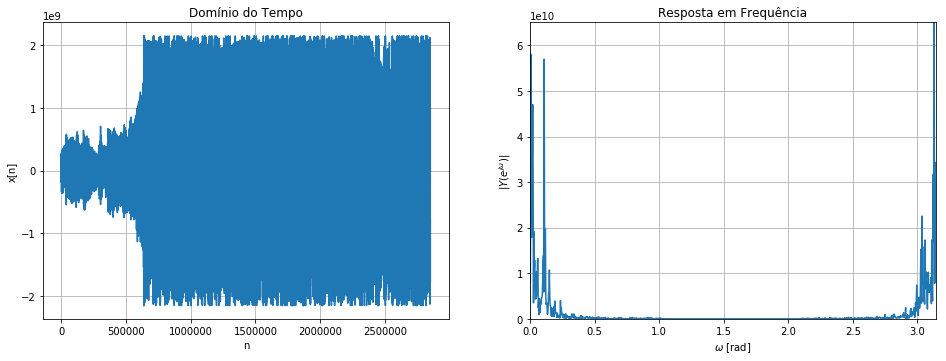

Informações da música do Creed após decimação por fator 6 com filtro.


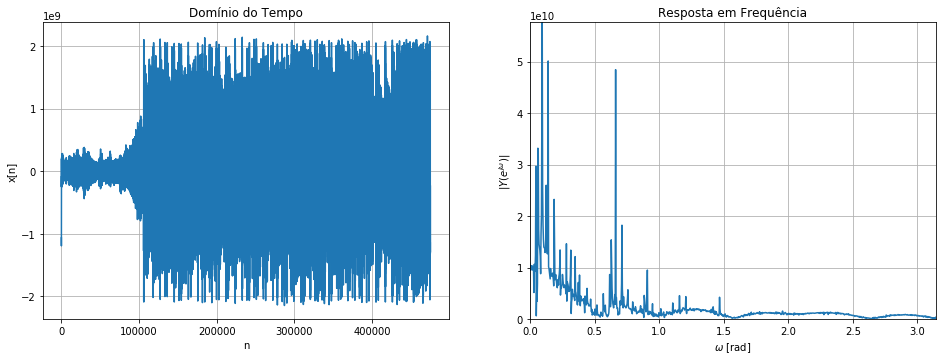

In [19]:
print(f'Informações da música do Creed.')
show_time_freq(musica, *spectre(musica))
print(f'Informações da música do Creed após decimação por fator {M} com filtro.')
show_time_freq(y, *spectre(y))

In [20]:
Fs = int(len(y) / rate_diff)
print('Fs: ', Fs, 'hz')
IPython.display.Audio(data=y, rate=Fs)

Fs:  14688 hz


Vamos aplicar um filtro com uma resposta em frequência maior, dessa maneira mais frequências serão capturadas. Isso ocasiona um maior aliasing, mas mesmo assim a música ainda é audível.

In [21]:
M = 6
fator = 1.01 
ganho = .01
fil = create_filter(150, fator=fator, ganho=ganho)
y_descobre_filtro = decimacao(musica, M, filtro=fil)

Filtro.


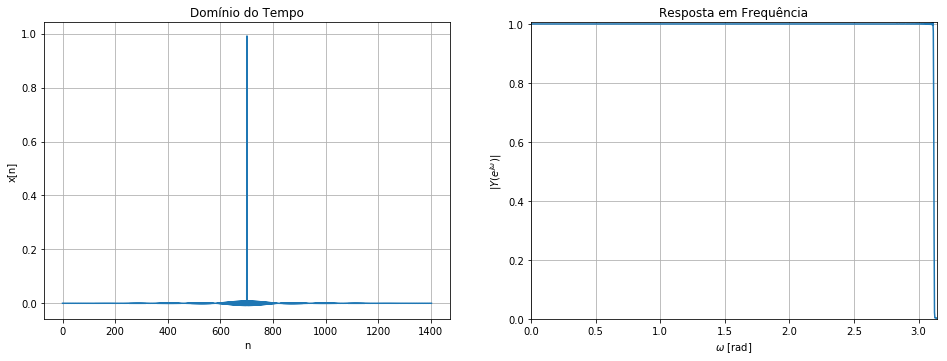

Informações da música do Creed após decimação por fator 6 com filtro.


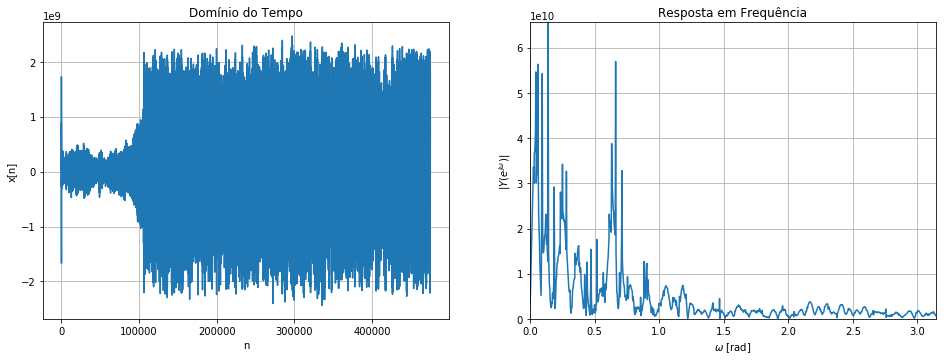

In [22]:
print(f'Filtro.')
show_time_freq(fil, *spectre(fil))
print(f'Informações da música do Creed após decimação por fator {M} com filtro.')
show_time_freq(y_descobre_filtro, *spectre(y_descobre_filtro))

In [23]:
Fs = int(len(y_descobre_filtro) / rate_diff)
print('Fs: ', Fs, 'hz')
IPython.display.Audio(data=y_descobre_filtro, rate=Fs)

Fs:  14688 hz


**(h)** Por fim, reduza a taxa de amostragem do sinal filtrado pelo mesmo fator M = 6 do item (e). Compare  espectro do sinal obtido com o sinal subamostrado do item (e) (ou seja, vamos comparar o sinal original ubamostrado e o sinal filtrado subamostrado). Escute ambos e discuta as diferenças. Neste caso, deve-se
também realizar uma pequena mudança na taxa de amostragem para ouvir o sinal adequadamente.

Informações da música do Creed original.


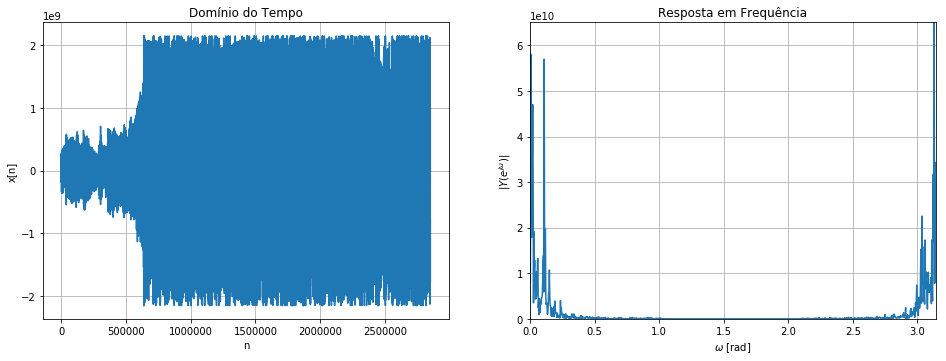

Informações da música do Creed após decimação por fator 6 sem filtro.


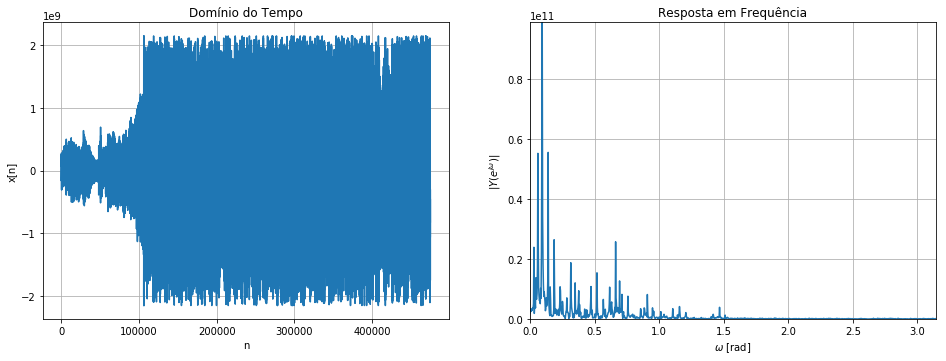

In [24]:
print(f'Informações da música do Creed original.')
show_time_freq(musica, *spectre(musica))
print(f'Informações da música do Creed após decimação por fator {M} sem filtro.')
show_time_freq(y_no_filter, *spectre(y_no_filter))

Como exemplificação, faremos uma decimação por um fator M = 20, para dessa maneira causar uma degradação no som. Usaremos o filtro passa-baixa com os valores padrão definidos inicialmente.

In [25]:
M = 20
y_degradado = decimacao(musica, M)

Informações da música do Creed após decimação por fator 20 com filtro.


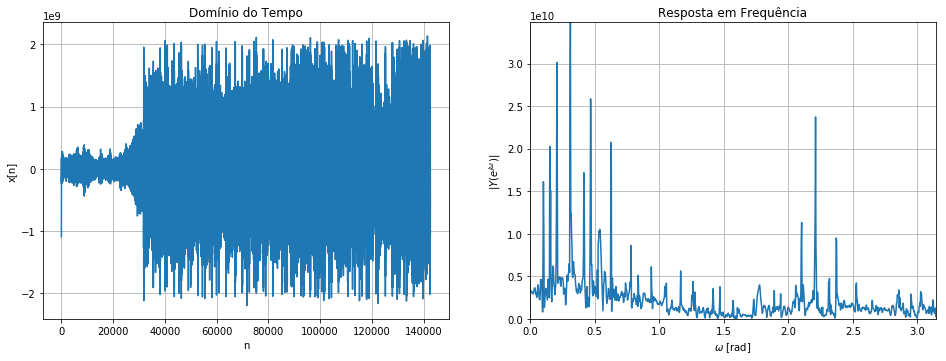

In [26]:
print(f'Informações da música do Creed após decimação por fator {M} com filtro.')
show_time_freq(y_degradado, *spectre(y_degradado))

In [27]:
Fs = int(len(y_degradado) / rate_diff)
print('Fs: ', Fs, 'hz')
IPython.display.Audio(data=y_degradado, rate=Fs)

Fs:  4406 hz


Com um fator de decimação com $M=20$ podemos percebe que as altas frequências, muitas foram removidas, ficando apenas as baixas e o aliasing entre as mesmas.
Apesar de audível, percebe-se que a música já não é igual a original, principalmente nos agudos.

**OBS**: Em todos os momentos, ao escutar os áudios esta sendo recalculadas a taxa de amostragem por segundo (sampling rate ou Fs). Sem esse recalculo, caso o audio fosse tocado com sua taxa original, ficaria muito distorcido e muitas vezes praticamente inaudível, por um atraso ou adiantamento na execução das amostras por segundo.